# All oscillation analysis

Brief 1-2 sentence description of notebook.

In [1]:
# Imports of all used packages and libraries
import sys
import os
import git
import glob
from collections import defaultdict

In [2]:
git_repo = git.Repo(".", search_parent_directories=True)
git_root = git_repo.git.rev_parse("--show-toplevel")

In [3]:
git_root

'/nancy/user/riwata/projects/reward_comp_ext'

In [4]:
sys.path.insert(0, os.path.join(git_root, 'src'))

In [5]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
import os
import collections
import itertools
from collections import defaultdict
from itertools import combinations

In [7]:
# Imports of all used packages and libraries
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import mannwhitneyu


In [8]:
import matplotlib
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import colorsys

In [9]:
from spectral_connectivity import Multitaper, Connectivity
import spectral_connectivity

In [10]:
import utilities.helper
import trodes.read_exported

In [11]:
FONTSIZE = 20

In [12]:
font = {'weight' : 'medium',
        'size'   : 20}

matplotlib.rc('font', **font)

## Inputs & Data

In [13]:
EPHYS_SAMPLE_RATE = 20000

Explanation of each input and where it comes from.

In [14]:
# Inputs and Required data loading
# input varaible names are in all caps snake case
# Whenever an input changes or is used for processing 
# the vairables are all lower in snake case
OUTPUT_DIR = r"./proc/" # where data is saved should always be shown in the inputs
os.makedirs(OUTPUT_DIR, exist_ok=True)
OUTPUT_PREFIX = "rce_pilot_3_alone_comp"

In [15]:
FULL_LFP_TRACES_PKL = "{}_10_per_trial_spectral_bans_sleap.pkl".format(OUTPUT_PREFIX)

In [16]:
LFP_SPECTRAL_DF = pd.read_pickle(os.path.join("./proc", FULL_LFP_TRACES_PKL))


## Outputs

Describe each output that the notebook creates. 

- Is it a plot or is it data?

- How valuable is the output and why is it valuable or useful?

## Functions 

## Processing

Describe what is done to the data here and how inputs are manipulated to generate outputs. 

In [17]:
# As much code and as many cells as required
# includes EDA and playing with data
# GO HAM!

# Ideally functions are defined here first and then data is processed using the functions

# function names are short and in snake case all lowercase
# a function name should be unique but does not have to describe the function
# doc strings describe functions not function names




In [18]:
LFP_SPECTRAL_DF.columns

Index(['tone_start_frame', 'reward_start', 'reward_dispensed',
       'tone_stop_frame', 'condition ', 'competition_closeness',
       'get_reward_frame', 'out_reward_frame', 'notes',
       'box_1_port_entry_frames',
       ...
       'trial_and_post_mPFC_gamma_phase', 'trial_and_post_mPFC_lfp_trace',
       'trial_and_post_mPFC_theta_band', 'trial_and_post_mPFC_theta_phase',
       'trial_and_post_vHPC_gamma_band', 'trial_and_post_vHPC_gamma_phase',
       'trial_and_post_vHPC_lfp_trace', 'trial_and_post_vHPC_theta_band',
       'trial_and_post_vHPC_theta_phase', 'trial_and_post_lfp_timestamps'],
      dtype='object', length=208)

In [19]:
all_freq_columns = [col for col in LFP_SPECTRAL_DF.columns if "all_frequencies_all_windows" in col]

In [20]:
for col in all_freq_columns:
    print(col)

trial_and_post_BLA_LH_coherence_all_frequencies_all_windows
trial_and_post_BLA_MD_coherence_all_frequencies_all_windows
trial_and_post_BLA_mPFC_coherence_all_frequencies_all_windows
trial_and_post_BLA_vHPC_coherence_all_frequencies_all_windows
trial_and_post_LH_MD_coherence_all_frequencies_all_windows
trial_and_post_LH_mPFC_coherence_all_frequencies_all_windows
trial_and_post_LH_vHPC_coherence_all_frequencies_all_windows
trial_and_post_MD_mPFC_coherence_all_frequencies_all_windows
trial_and_post_MD_vHPC_coherence_all_frequencies_all_windows
trial_and_post_mPFC_vHPC_coherence_all_frequencies_all_windows
trial_and_post_BLA_LH_granger_all_frequencies_all_windows
trial_and_post_BLA_MD_granger_all_frequencies_all_windows
trial_and_post_BLA_mPFC_granger_all_frequencies_all_windows
trial_and_post_BLA_vHPC_granger_all_frequencies_all_windows
trial_and_post_LH_BLA_granger_all_frequencies_all_windows
trial_and_post_LH_MD_granger_all_frequencies_all_windows
trial_and_post_LH_mPFC_granger_all_freq

In [21]:
LFP_SPECTRAL_DF[col].iloc[0].shape

(40, 56)

In [22]:
LFP_SPECTRAL_DF["competition_closeness"].unique()

array(['After trial', 'Subj 2 Only', 'Subj 2 blocking Subj 1',
       'Subj 2 then Subj 1', 'Close Call', 'Subj 1 then Subj 2',
       'Subj 1 Only', 'Subj 1 blocking Subj 2'], dtype=object)

In [23]:
OUTCOME_TO_COLOR = {"both_rewarded": "green", 
"novel_lose": "#e67073",
                    "novel_lose_competitive": "#e67073",
                    "novel_lose_no_comp": "#e67073",
"novel_win": "#93a5da",
                    "novel_win_competitive": "#93a5da",
                    "novel_win_no_comp": "#93a5da",
"lose": "#951a1d",
                    "lose_no_comp": "#951a1d",
                    "lose_competitive": "#951a1d",
"alone_rewarded": "#0499af",
"win": "#3853a3",
                    "win_competitive": "#3853a3",
                    "win_no_comp": "#3853a3",

"omission": "orange"}

In [24]:
session_types = ["training", "omission", "both", "novel"]

In [25]:
BAND_TO_FREQ_PLOT = {'theta': (4, 12), 'gamma': (30, 50)}
BAND_TO_FREQ_COLOR = {'theta': "red", 'beta': "blue", 'gamma': "green"}

In [26]:
preprocessing_type = ""

In [27]:
comp_closeness_dict = {'Subj 1 blocking Subj 2': "competitive",
'Subj 2 Only': "no_comp",
'Subj 2 blocking Subj 1': "competitive",
'Subj 1 then Subj 2': "competitive", 
'Subj 1 Only': "no_comp",
'Subj 2 then Subj 1': "competitive",
'Close Call': "competitive",
'After trial': "no_comp"}

In [28]:
LFP_SPECTRAL_DF["condition "] = LFP_SPECTRAL_DF["condition "].astype(str).apply(lambda x: x.strip())

In [29]:
LFP_SPECTRAL_DF["current_subject"] = LFP_SPECTRAL_DF["current_subject"].astype(str).apply(lambda x: x.strip())

In [30]:
LFP_SPECTRAL_DF["agent"] = LFP_SPECTRAL_DF["agent"].astype(str).apply(lambda x: x.strip())

In [31]:
LFP_SPECTRAL_DF["trial_label"] = LFP_SPECTRAL_DF.apply(lambda x: "win" if x["condition "] == x["current_subject"] else ("lose" if x["condition "] == x["agent"] else "tie"), axis=1)

In [32]:
LFP_SPECTRAL_DF["competition_closeness"] = LFP_SPECTRAL_DF["competition_closeness"].map(comp_closeness_dict)

In [33]:
LFP_SPECTRAL_DF["competitive_trial_label"] = LFP_SPECTRAL_DF.apply(lambda x: "_".join([x["trial_label"], x["competition_closeness"]]), axis=1)


In [34]:
comp_to_style = {key: ("--" if "no_comp" in key else "-") for key in LFP_SPECTRAL_DF["competitive_trial_label"].unique() }

In [35]:
LFP_SPECTRAL_DF = LFP_SPECTRAL_DF[LFP_SPECTRAL_DF["trial_label"] != "tie"]

In [36]:
comp_to_style

{'lose_no_comp': '--',
 'win_no_comp': '--',
 'lose_competitive': '-',
 'win_competitive': '-',
 'tie_competitive': '-'}

In [37]:
LFP_SPECTRAL_DF["competition_closeness"]

0          no_comp
1          no_comp
2          no_comp
3          no_comp
4      competitive
          ...     
241    competitive
242    competitive
243    competitive
244    competitive
245    competitive
Name: competition_closeness, Length: 232, dtype: object

In [38]:
LFP_SPECTRAL_DF["trial_label"]

0      lose
1       win
2      lose
3       win
4      lose
       ... 
241     win
242    lose
243     win
244    lose
245     win
Name: trial_label, Length: 232, dtype: object

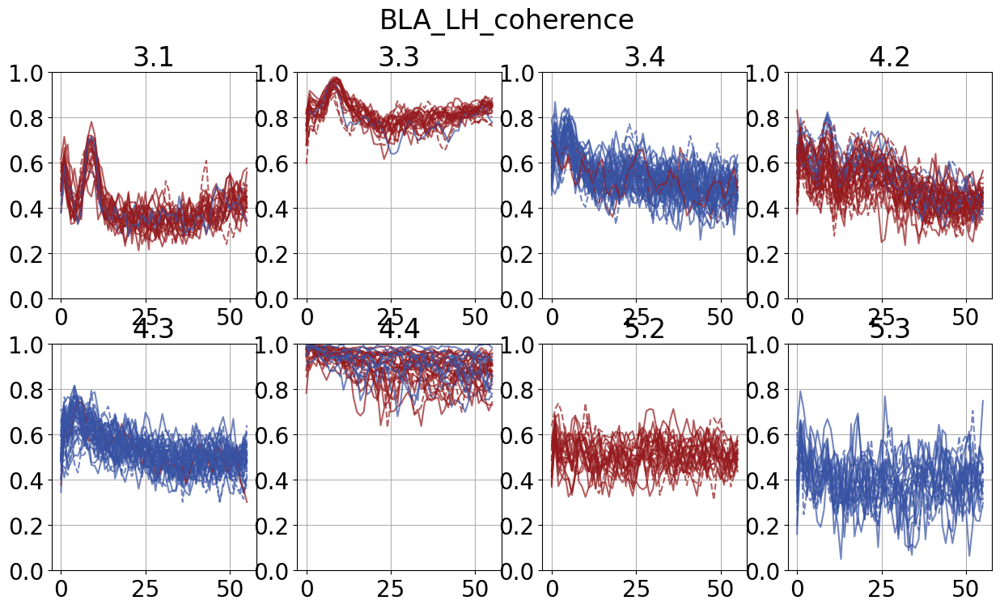

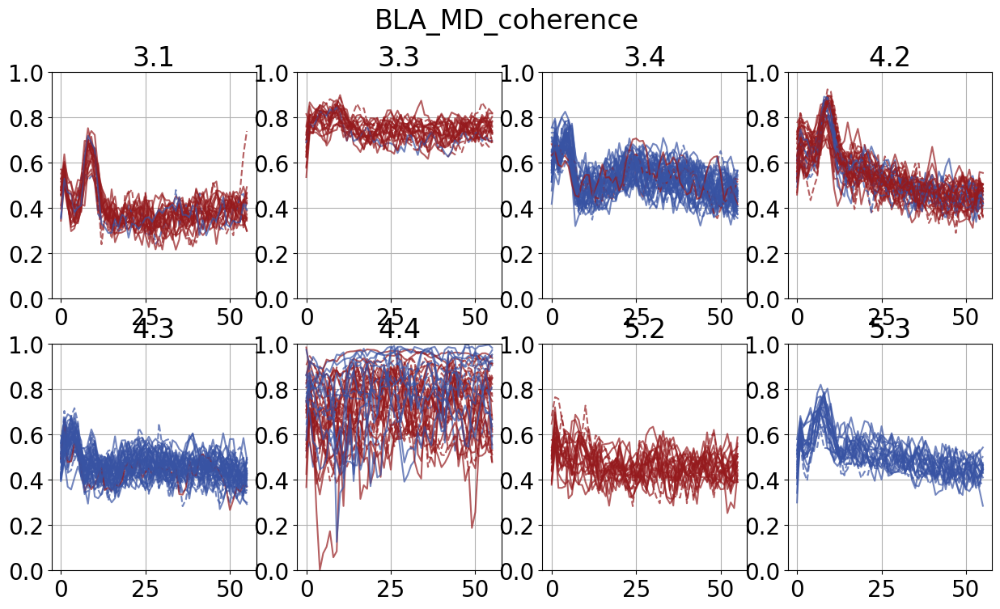

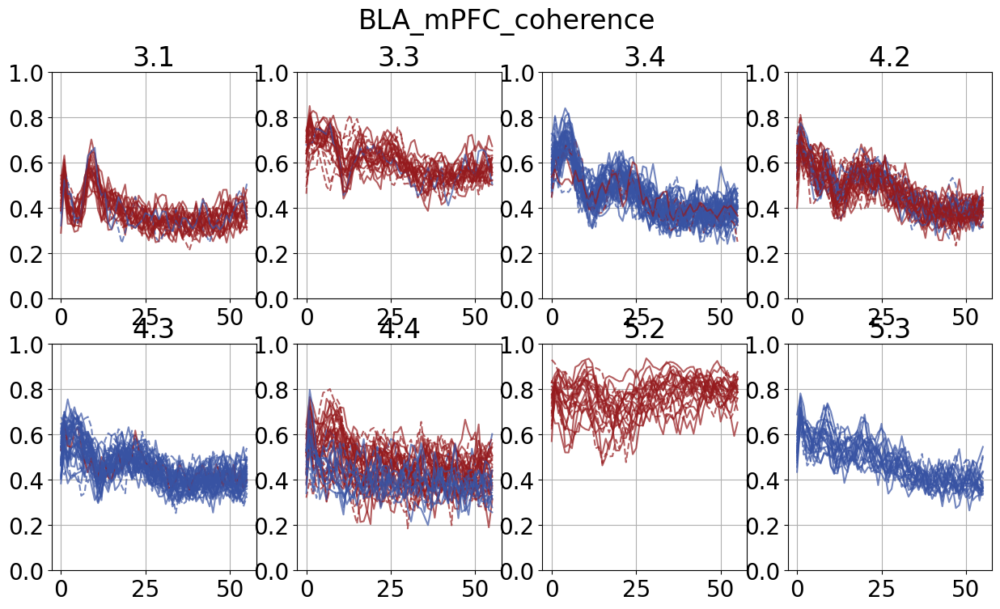

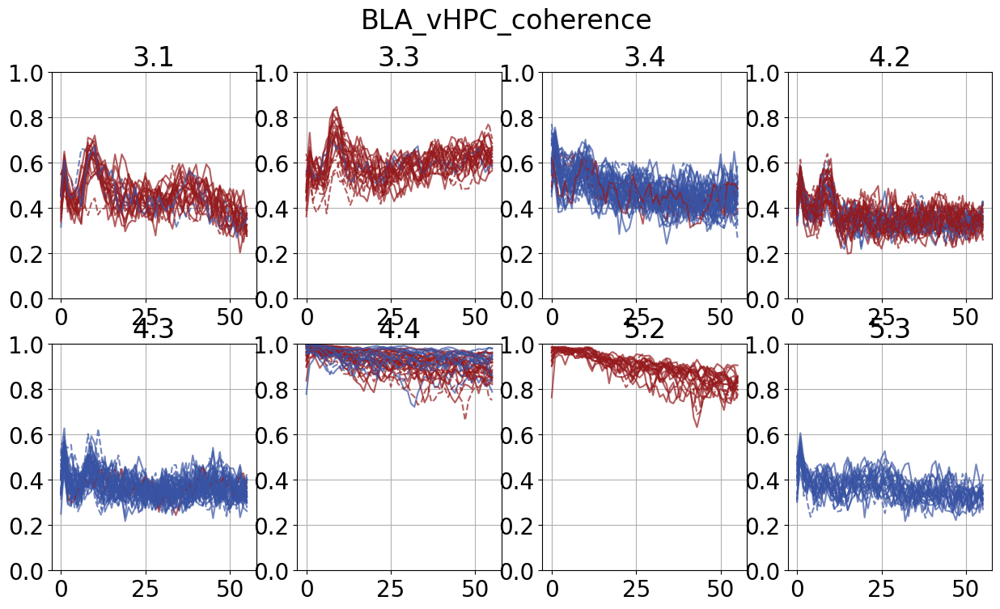

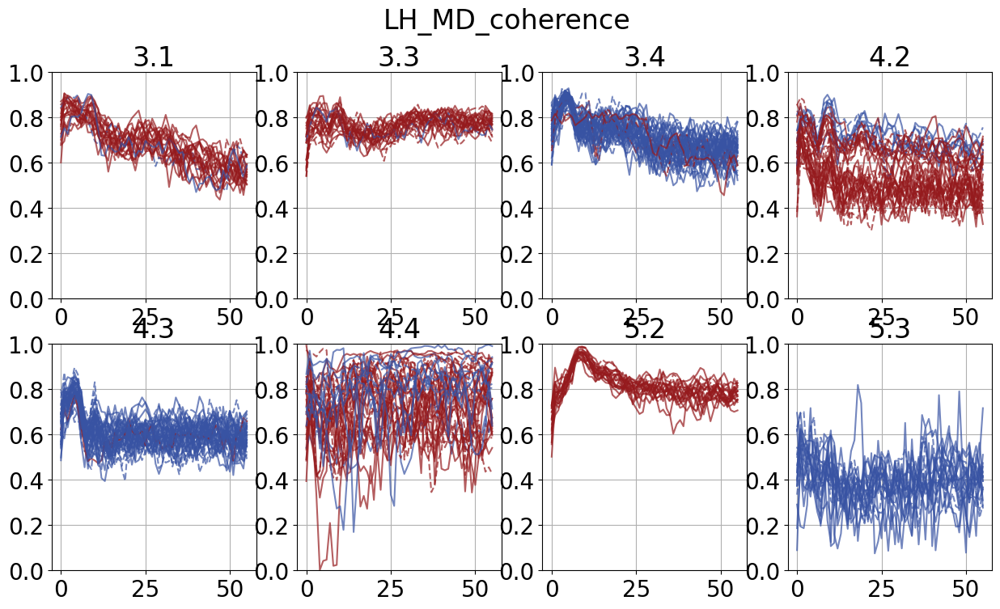

...

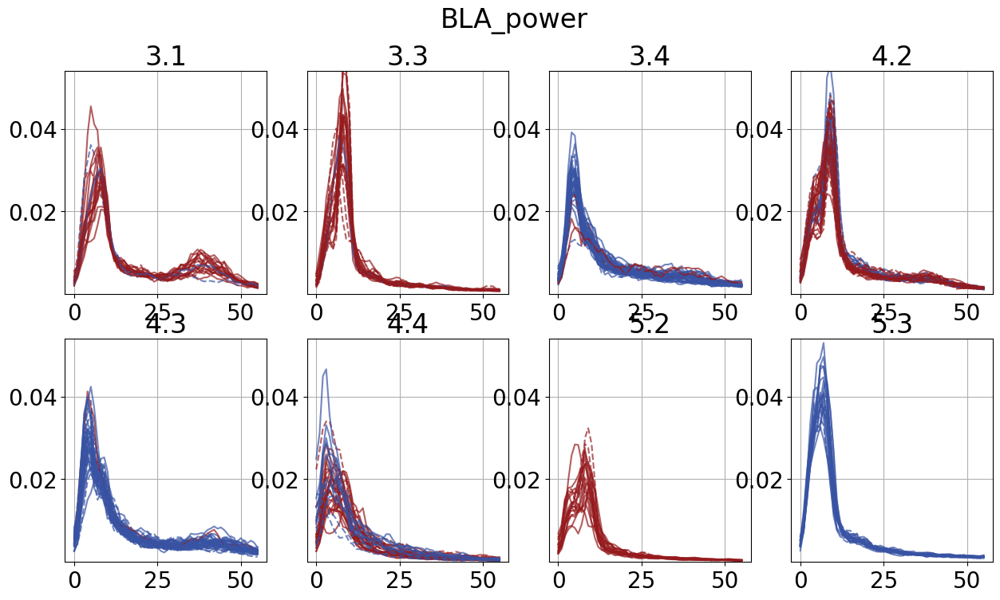

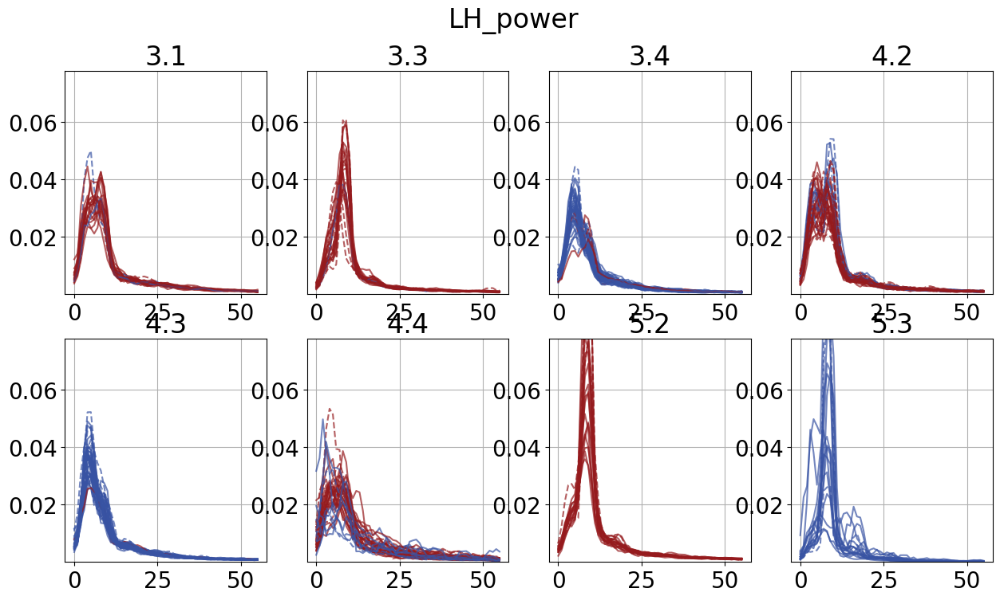

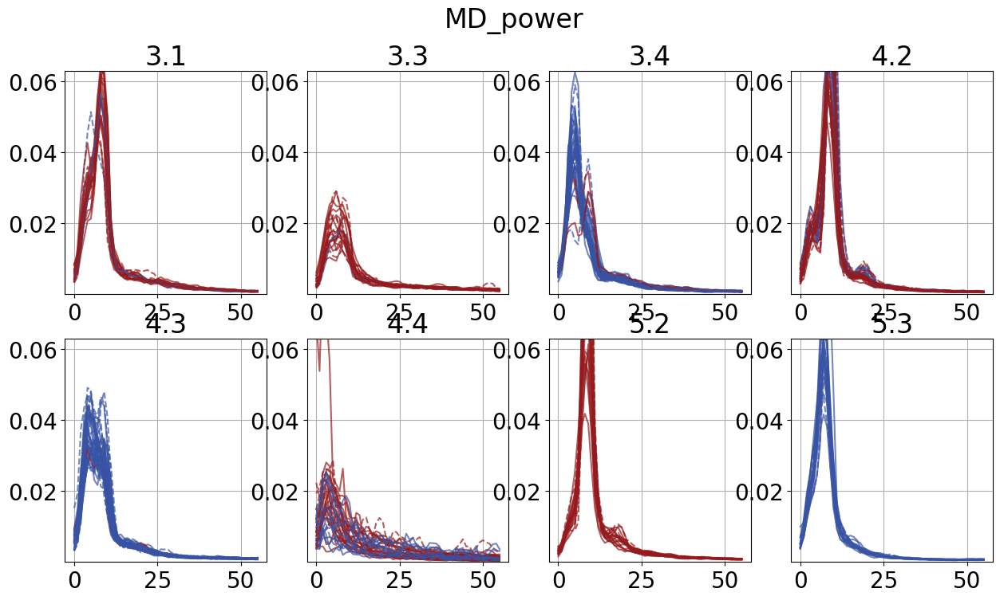

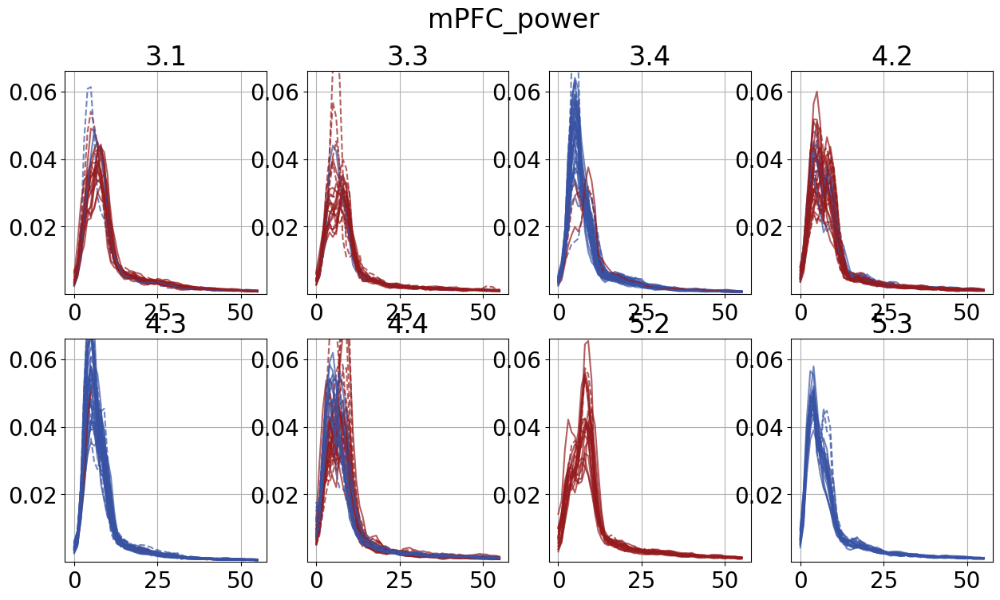

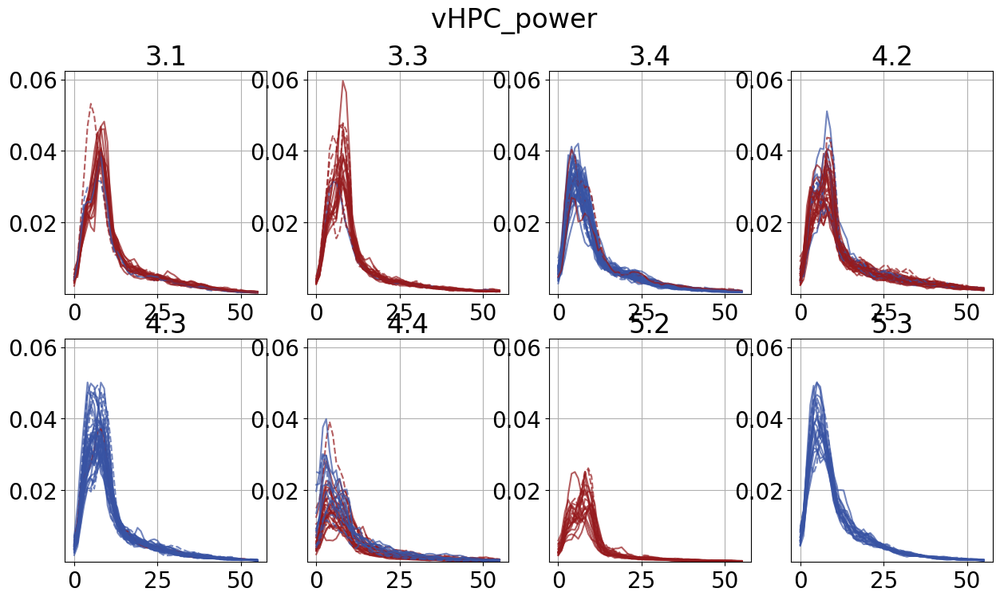

In [41]:

for col in all_freq_columns:
    stripped_column = col.replace("trial_and_post_", "").replace("_all_frequencies_all_windows", "")
    fig, axs = plt.subplots(2, 4, figsize=(15, 8))  # Create the figure and 8 subplots (2x4)
    fig.suptitle(stripped_column)  # Set the title for the entire figure
    max_y = np.nanmax(LFP_SPECTRAL_DF[col].apply(lambda x: np.nanmax(x)))
    min_y = np.nanmin(LFP_SPECTRAL_DF[col].apply(lambda x: np.nanmin(x)))

    for num in range(8):
        ax = axs[num // 4, num % 4]  # Select the appropriate subplot
        current_subj = sorted(LFP_SPECTRAL_DF["current_subject"].unique())[num]
        ax.grid()
        ax.set_title(current_subj)  # Set the title for the entire figure

        current_subject_df = LFP_SPECTRAL_DF[LFP_SPECTRAL_DF["current_subject"] == current_subj]
        
        for index, row in current_subject_df.iterrows():
            ax.plot(np.nanmean(row[col], axis=0), color=OUTCOME_TO_COLOR[row["competitive_trial_label"]], linestyle=comp_to_style[row["competitive_trial_label"]], alpha=0.7)
        if "coherence" in col or "granger" in col:
            ax.set_ylim(0, 1)
        else:
            ax.set_ylim(min_y, max_y * 0.25)

    plt.savefig(os.path.join("./proc/trial_traces", "{}.png".format(stripped_column)))
    plt.show()
    
        
        

In [40]:
raise ValueError()

ValueError: 

In [ ]:

    fig.suptitle(row["recording"])  # Set the title for the entire figure
    all_traces = np.array(list(row["per_region_lfp_trace"].values()))[:, :duration]
    max_value = np.nanmax(all_traces)
    min_value = np.nanmin(all_traces)

    if max_value >= 3000:
        max_value = 3000
    if min_value <= -3000:
        min_value = -3000

    for num in range(len(row["per_region_lfp_trace"]) // channel_groups):
        all_channels = []
        ax = axs[num // 4, num % 4]  # Select the appropriate subplot

In [ ]:

for col in all_freq_columns:
    stripped_column = col.replace("trial_and_post_", "").replace("_all_frequencies_all_windows", "")
    for subj in sorted(LFP_SPECTRAL_DF["current_subject"].unique()):
        current_subject_df = LFP_SPECTRAL_DF[LFP_SPECTRAL_DF["current_subject"] == subj]
        fig, ax = plt.subplots()
        ax.grid()
        plt.title("{} {}".format(stripped_column, subj))
        for index, row in current_subject_df.iterrows():
            plt.plot(np.nanmean(row[col], axis=0), color=OUTCOME_TO_COLOR[row["competitive_trial_label"]], linestyle=comp_to_style[row["competitive_trial_label"]])
        if "coherence" in col or "granger" in col:
            plt.ylim(0, 1)
        
        plt.savefig(os.path.join("./proc/trial_traces", "{}_{}.png".format(stripped_column, subj)))
    
        
        